# Purpose:

Utilized in training machine learning models to detect and classify different kinds of sports from pictures

Targeted at differentiating 100 unique sports categories

# 1. Setup and Load Data
## 1.1. Import libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import seaborn as sn
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import os
import cv2
import datetime
from sklearn.manifold import TSNE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1.2. Download datasets

In [ ]:
!kaggle datasets download -d gpiosenka/sports-classification
! mkdir dataset

! unzip "sports-classification.zip" -d dataset

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/rings/022.jpg  
  inflating: dataset/train/rings/023.jpg  
  inflating: dataset/train/rings/024.jpg  
  inflating: dataset/train/rings/025.jpg  
  inflating: dataset/train/rings/026.jpg  
  inflating: dataset/train/rings/027.jpg  
  inflating: dataset/train/rings/028.jpg  
  inflating: dataset/train/rings/029.jpg  
  inflating: dataset/train/rings/030.jpg  
  inflating: dataset/train/rings/031.jpg  
  inflating: dataset/train/rings/032.jpg  
  inflating: dataset/train/rings/033.jpg  
  inflating: dataset/train/rings/034.jpg  
  inflating: dataset/train/rings/035.jpg  
  inflating: dataset/train/rings/036.jpg  
  inflating: dataset/train/rings/037.jpg  
  inflating: dataset/train/rings/038.jpg  
  inflating: dataset/train/rings/039.jpg  
  inflating: dataset/train/rings/040.jpg  
  inflating: dataset/train/rings/041.jpg  
  inflating: dataset/train/rings/042.jpg  
  inflating: dataset/train/rings/043.jpg  
  i

#1.3. Define constants

In [ ]:
TRAIN_SIZE_AUGMENTED = 200 #per class
TOTAL_TRAIN_SIZE_AUGMENTED = 20000
SEED = 4651
CLASS_NAMES = []
CLASS_SIZE = -1
BATCH_SIZE = 32
EPOCHS = 30
IMAGE_SIZE = (224, 224)
IMAGE_SHAPE = (224, 224, 3)
CHANNELS = 3

# 1.4. Load the dataset

This dataset is designed for sports image classification tasks, containing images of 100 different sports activities.

It includes common sports like basketball, soccer, tennis,but includes less common sports and activities

In [ ]:
df = pd.read_csv('./dataset/sports.csv')

# 1. Collect label data for each dataset
train_df = df[df['data set'] == 'train']
valid_df = df[df['data set'] == 'valid']
test_df = df[df['data set'] == 'test']

CLASS_NAMES = sorted(df['labels'].unique())
CLASS_SIZE = len(CLASS_NAMES)

le = LabelEncoder()
le.fit(CLASS_NAMES)

# Print original distribution
print("Original training distribution:")
print(train_df['labels'].value_counts())

Original training distribution:
labels
football              191
formula 1 racing      190
nascar racing         189
baseball              174
hockey                172
                     ... 
horseshoe pitching    102
arm wrestling          99
wingsuit flying        98
ultimate               97
sky surfing            59
Name: count, Length: 100, dtype: int64


In [ ]:
for i, class_name in enumerate(le.classes_):
    print(f"Label {i}: {class_name}")

Label 0: air hockey
Label 1: ampute football
Label 2: archery
Label 3: arm wrestling
Label 4: axe throwing
Label 5: balance beam
Label 6: barell racing
Label 7: baseball
Label 8: basketball
Label 9: baton twirling
Label 10: bike polo
Label 11: billiards
Label 12: bmx
Label 13: bobsled
Label 14: bowling
Label 15: boxing
Label 16: bull riding
Label 17: bungee jumping
Label 18: canoe slamon
Label 19: cheerleading
Label 20: chuckwagon racing
Label 21: cricket
Label 22: croquet
Label 23: curling
Label 24: disc golf
Label 25: fencing
Label 26: field hockey
Label 27: figure skating men
Label 28: figure skating pairs
Label 29: figure skating women
Label 30: fly fishing
Label 31: football
Label 32: formula 1 racing
Label 33: frisbee
Label 34: gaga
Label 35: giant slalom
Label 36: golf
Label 37: hammer throw
Label 38: hang gliding
Label 39: harness racing
Label 40: high jump
Label 41: hockey
Label 42: horse jumping
Label 43: horse racing
Label 44: horseshoe pitching
Label 45: hurdles
Label 46: h

Show the dataset distribution

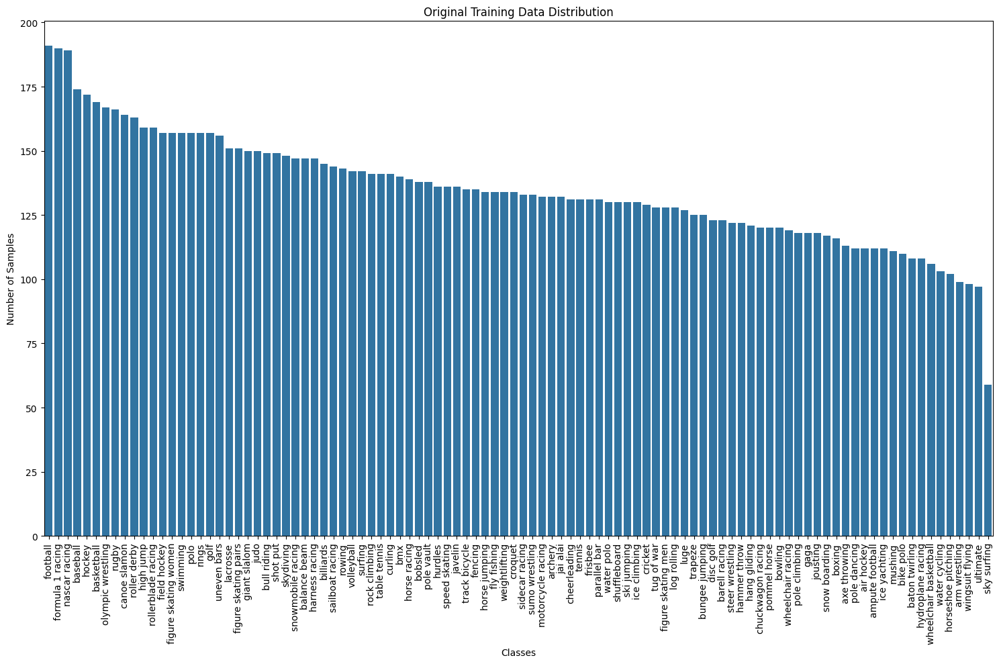

Original training samples: 13493


In [ ]:
plt.figure(figsize=(15, 10))

# Plot original distribution
sns.barplot(x=train_df['labels'].value_counts().index,
            y=train_df['labels'].value_counts().values)
plt.title('Original Training Data Distribution')
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.xticks(rotation=90)
# prevent label overlap
plt.tight_layout()
plt.show()

print(f"Original training samples: {len(train_df)}")

In [ ]:
# Create initial datasets
train_dataset = {
    'filepaths': train_df['filepaths'].values,
    'labels': le.transform(train_df['labels'].values)
}

valid_dataset = {
    'filepaths': valid_df['filepaths'].values,
    'labels': le.transform(valid_df['labels'].values)
}

test_dataset = {
    'filepaths': test_df['filepaths'].values,
    'labels': le.transform(test_df['labels'].values)
}

# 1.5. Preprocess the dataset

Do augmentation

In [ ]:
def augment_train_dataset(test_dataset, target_size=TRAIN_SIZE_AUGMENTED):
    augmentation = tf.keras.Sequential([
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomZoom(0.2),
        tf.keras.layers.RandomTranslation(0.2, 0.2)
    ])

    augmented_images = []
    augmented_labels = []

    unique_labels = np.unique(test_dataset['labels']) # labels here are all numerical numbers, as label encoder transform it already

    for label in unique_labels:
        class_indices = test_dataset['labels'] == label
        class_filepaths = test_dataset['filepaths'][class_indices]

        class_images = []
        for filepath in class_filepaths:
            img = cv2.imread(os.path.join('dataset', filepath))
            if img is not None:
                img = cv2.resize(img, IMAGE_SIZE)
                class_images.append(img)

        if not class_images:
            print(f"No valid images found for label {label}")
            continue

        augmented_images.extend(class_images)
        augmented_labels.extend([label] * len(class_images))

        needed = target_size - len(class_images)
        if needed <= 0:
            continue

        while needed > 0:
            for img in class_images:
                if needed <= 0:
                    break
                img_tensor = tf.convert_to_tensor(img)
                aug_img = augmentation(img_tensor).numpy()
                augmented_images.append(aug_img)
                augmented_labels.append(label)
                needed -= 1

    train_dataset_df = {
        'images': np.array(augmented_images),
        'labels': np.array(augmented_labels)
    }

    # Convert to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_labels = np.array(augmented_labels)

    print(f"Total number of training samples: {len(augmented_labels)}")

    # Convert to tf.data.Dataset
    train_dataset = tf.data.Dataset.from_tensor_slices((
        tf.cast(augmented_images, tf.float32),
        tf.cast(augmented_labels, tf.int32)
    ))

    # Add shuffling, batching and prefetching
    train_dataset = train_dataset.shuffle(buffer_size=TOTAL_TRAIN_SIZE_AUGMENTED).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

    return train_dataset, train_dataset_df

In [ ]:
train_dataset, train_dataset_df = augment_train_dataset(train_dataset)

Total number of training samples: 20000


In [ ]:
print(f"Augmented train set shape: {train_dataset}")

Augmented train set shape: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


Load and resize validation and test datasets without augmentation


In [ ]:
def load_dataset(dataset):
    images = []
    labels = []
    for filepath, label in zip(dataset['filepaths'], dataset['labels']):
        img_path = os.path.join('dataset', filepath)
        img = cv2.imread(os.path.join('dataset', filepath))
        if img is None:
          print(f"Failed to load image: {img_path}")
          continue

        img = cv2.resize(img, IMAGE_SIZE)
        images.append(img)
        labels.append(label)

    images = np.array(images)
    labels = np.array(labels)

    print(f"Total number of samples: {len(labels)}")

    # Convert to tf.data.Dataset
    new_dataset = tf.data.Dataset.from_tensor_slices((
        tf.cast(images, tf.float32),
        tf.cast(labels, tf.int32)
    ))

    # Add shuffling, batching and prefetching
    new_dataset = new_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

    return new_dataset

In [ ]:
print("For size of valid dataset:")
valid_dataset = load_dataset(valid_dataset)
print("For size of test dataset:")
test_dataset = load_dataset(test_dataset)

For size of valid dataset:
Total number of samples: 500
For size of test dataset:
Total number of samples: 500


Show the dataset distribution

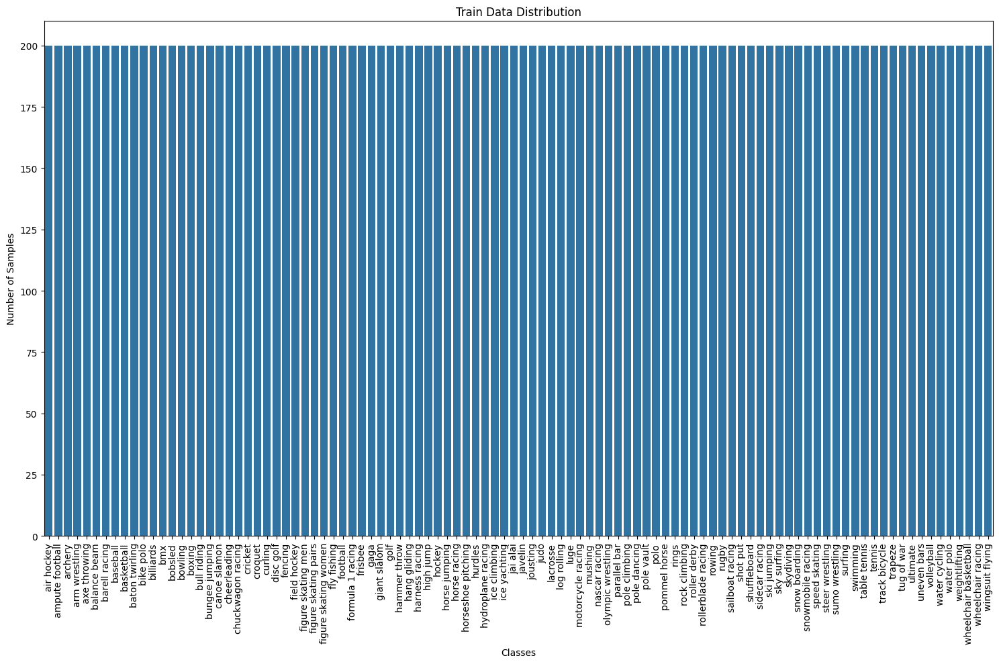

Train samples: 20000


In [ ]:
unique_labels, indices, counts = tf.unique_with_counts(train_dataset_df['labels'])
class_names = le.inverse_transform(unique_labels.numpy())

plt.figure(figsize=(15, 10))
sns.barplot(x=class_names, y=counts.numpy())
plt.title('Train Data Distribution')
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

print(f"Train samples: {len(train_dataset_df['labels'])}")

## 1.6. Data visualization

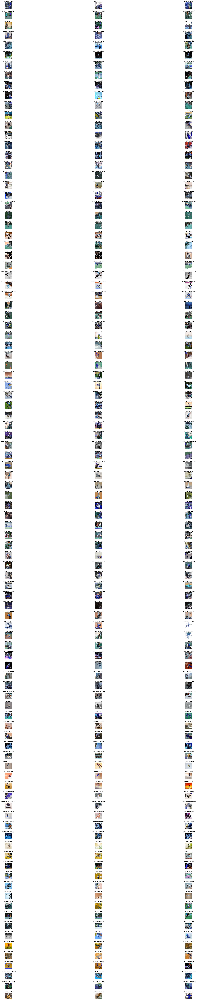

In [ ]:
plt.figure(figsize=(50, 200))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# For each label
for idx, label in enumerate(CLASS_NAMES):
    numerical_label = le.transform([label])[0]
    # get indices where this label appears
    label_indices = [i for i, l in enumerate(train_dataset_df['labels']) if l == numerical_label]

    selected_indices = np.random.choice(label_indices, size=3, replace=False)

    # plot each of the 3 images
    for j in range(3):
        plt.subplot(len(unique_labels), 3, idx * 3 + j + 1)
        plt.imshow(train_dataset_df['images'][selected_indices[j]].astype('uint8'))
        plt.title(f'Label: {le.inverse_transform([numerical_label])[0]}')
        plt.axis('off')

plt.show()

# 2. Model Implementaiton

## Build the Model

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model

In [ ]:
# Load pre-trained DenseNet121 without top layer
base_model = DenseNet121(
    weights='imagenet',
    include_top=False,
    input_shape=IMAGE_SHAPE
)

base_model.trainable = True

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.2)(x)

predictions = layers.Dense(CLASS_SIZE, activation='softmax')(x)

# 3. Model Training

## 3.1. Setup the Model configuation

In [ ]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.0005,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    decay=1e-6
)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [ ]:
print("Main Model Summary:")
model.summary()

Main Model Summary:


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer_1[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 7,719,332 (29.45 MB)

 Trainable params: 7,635,684 (29.13 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [ ]:
model.load_weights('/content/drive/MyDrive/sport_classification.weights.h5')

## 3.2. Train the Model

In [ ]:
log_dir = "logs_onestage/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    update_freq='epoch'
)

In [ ]:
history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=valid_dataset,
    callbacks=[tensorboard_callback]
)


Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 184s 103ms/step - accuracy: 0.3054 - loss: 2.5638 - val_accuracy: 0.5320 - val_loss: 1.5975
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.4802 - loss: 1.8424 - val_accuracy: 0.6040 - val_loss: 1.3468
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.5763 - loss: 1.4589 - val_accuracy: 0.6780 - val_loss: 1.0627
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.6570 - loss: 1.1572 - val_accuracy: 0.7540 - val_loss: 0.9356
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.7300 - loss: 0.9112 - val_accuracy: 0.7260 - val_loss: 0.8626
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.7644 - loss: 0.7813 - val_accuracy: 0.7840 - val_loss: 0.7002
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.8019 - loss: 0.6487 - val_accuracy: 0.8120 - val_loss: 0.6489
Epoch 8/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8260 - loss: 0.5690 

In [ ]:
model.save_weights('/content/drive/MyDrive/sport_classification.weights.h5')

# 4.Model Evaluation

## 4.1. Accuracy history

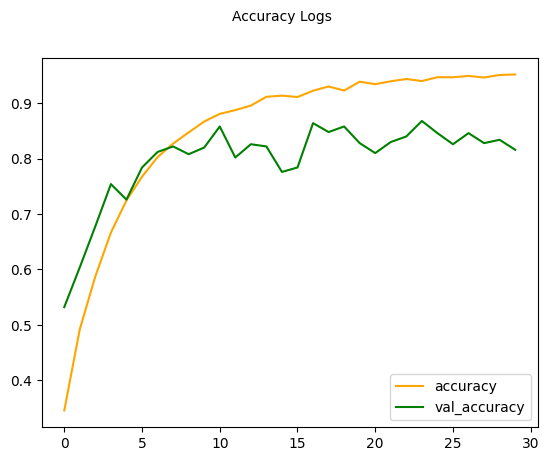

In [ ]:
fig = plt.figure()
plt.plot(history.history['accuracy'], color = 'orange', label = 'accuracy')
plt.plot(history.history['val_accuracy'], color = 'green', label = 'val_accuracy')
fig.suptitle('Accuracy Logs', fontsize = 10)
plt.legend(loc = 'lower right')
plt.show()

## 4.2. Loss history

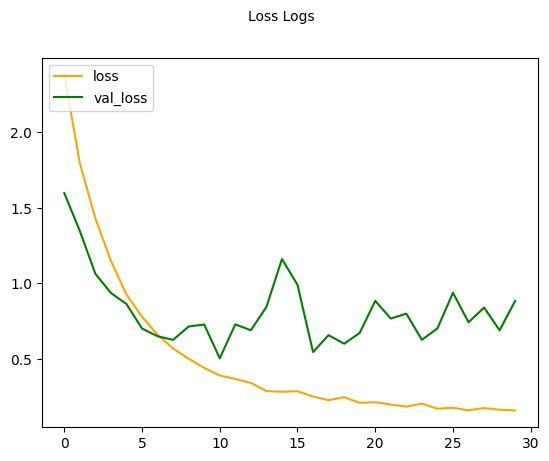

In [ ]:
fig = plt.figure()
plt.plot(history.history['loss'], color = 'orange', label = 'loss')
plt.plot(history.history['val_loss'], color = 'green', label = 'val_loss')
fig.suptitle('Loss Logs', fontsize = 10)
plt.legend(loc = 'upper left')
plt.show()

Through the examination of the graphs contained in the data, particularly the graphs of the model input, it is clear that the model performed quite well training over a period of 30 epochs. The graph showing training accuracy shows a superb growth rate, up to 95 percent whilst the validation accuracy remains constant at 82 percent. The loss curves tell a good story of learning, whereby the training loss levels off at 0.2, which is a low figure and indicates that the model has learned all the necessary movement patterns for the classification of sports. Also, in this instance, the validation loss curve appears to be horizontal suggesting that the model has good learning stability during the experiment. On the whole, the graphs appear not to contradict the results of the other measures and provide evidence of good training on the model. The model was able to learn how to perfectly recognize signs accurate for every field of sports.



In [ ]:
runtime.unassign()

## 4.3. Evaluation using Test Dataset

In [ ]:
test_loss, test_accuracy = model.evaluate(test_dataset)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.8971 - loss: 0.4113
Test loss: 0.4139212965965271
Test accuracy: 0.8859999775886536


The test accuracy has achieved around 89%. It is a very good result.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


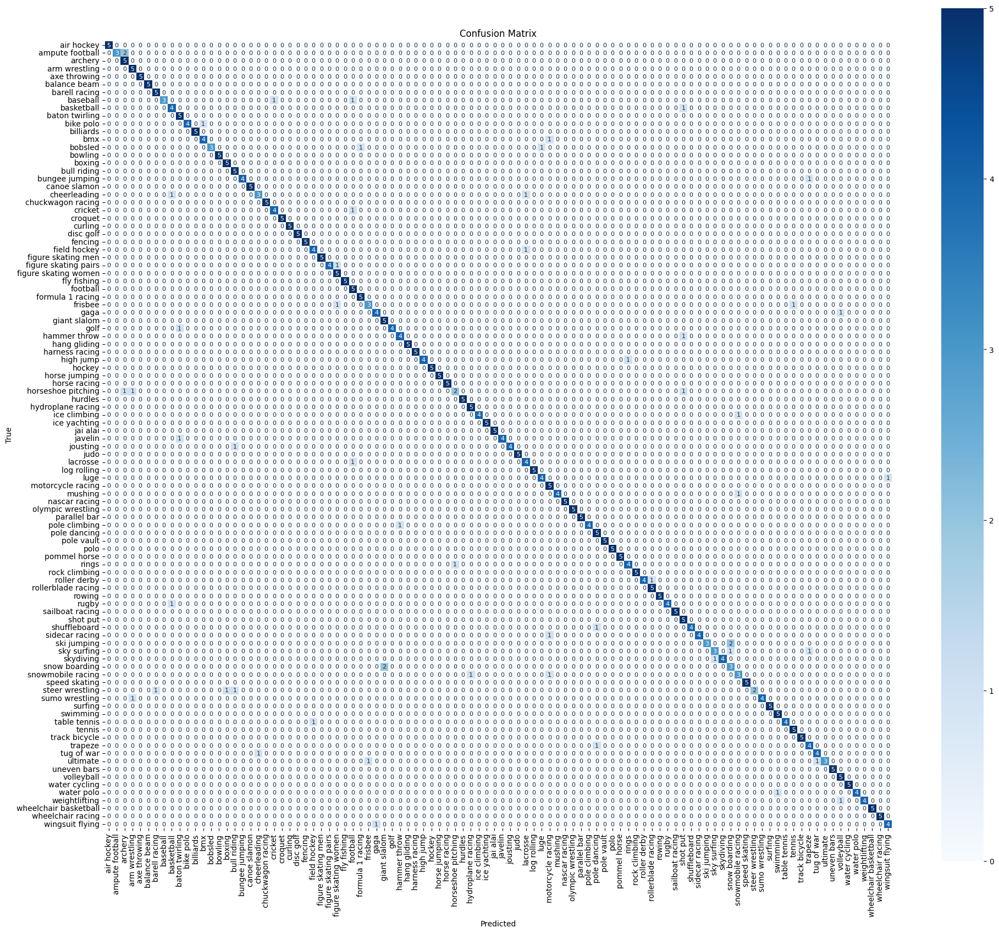

In [ ]:
confusion_mtx = tf.zeros((CLASS_SIZE, CLASS_SIZE), dtype=tf.int32)

# Accumulate predictions batch by batch
for images, labels in test_dataset:
    predictions = model.predict(images)
    predicted_labels = tf.argmax(predictions, axis=1)
    batch_confusion = tf.math.confusion_matrix(
        labels,
        predicted_labels,
        num_classes=CLASS_SIZE
    )
    confusion_mtx += batch_confusion

cm = confusion_mtx.numpy()

# large figure
plt.figure(figsize=(20, 20))

# create heatmap
sn.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    square=True,
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    annot_kws={'size': 8},
    cbar_kws={'shrink': .8}
)

# rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# add labels
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

# adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

According to the confusion matrix, the model achieves high classification accuracy between 100 sports categories, with a prominent blue diagonal line indicating the number of accurate predictions. The occurrence of misclassifications between different sports is minimal, as indicated by the white regions off the diagonal. In conclusion, the model seems to be able to discriminate well between a number of different sports activities.

# 4.4. Feature pattern distribution

In [ ]:
def analyze_feature_space(model, test_dataset, le):
    # create feature extraction model using the output of GlobalAveragePooling2D
    feature_model = tf.keras.Model(
        inputs=model.input,
        outputs=model.get_layer('global_average_pooling2d').output
    )

    # collect features and labels batch by batch
    all_features = []
    all_labels = []

    for x_batch, y_batch in test_dataset:
        batch_features = feature_model.predict(x_batch, verbose=0)
        all_features.append(batch_features)
        all_labels.append(y_batch.numpy())

    # combine batches to get the whole overview
    features = np.concatenate(all_features)
    y_data = np.concatenate(all_labels)

    # Generate colors using HSV color space for better distinction
    num_classes = len(np.unique(y_data))
    colors = plt.cm.rainbow(np.linspace(0, 1, num_classes))

    # reduce dimensionality for visualization
    tsne = TSNE(n_components=2, random_state=42)
    features_2d = tsne.fit_transform(features)

    # plot different classes
    plt.figure(figsize=(10, 8))
    for i, color in enumerate(colors):
        mask = y_data == i #i here represent label number also
        label = le.inverse_transform([i])[0]  # Convert numeric label back to string
        plt.scatter(features_2d[mask, 0], features_2d[mask, 1],
                   label=label, alpha=0.6, c=[color])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title('Feature Space Distribution')
    plt.tight_layout()
    plt.show()

<ipython-input-59-3291e0cb02a8>:39: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


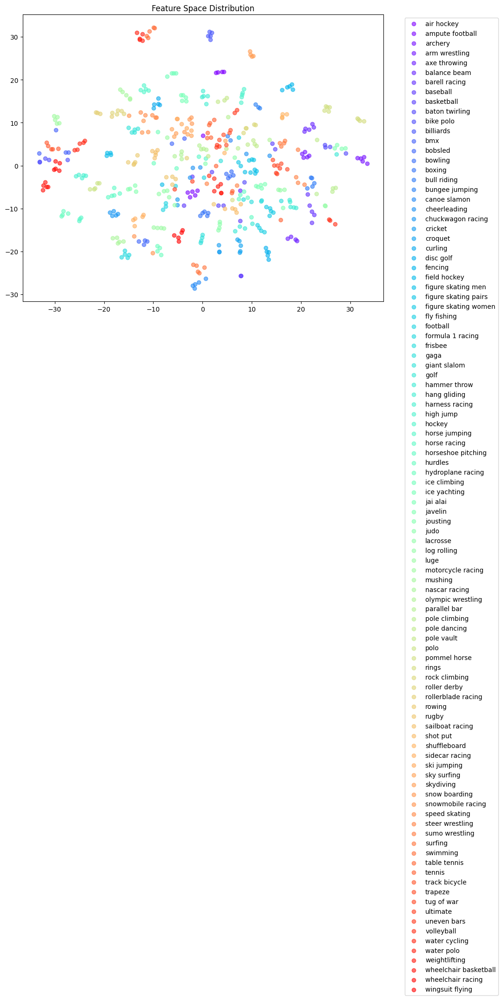

In [ ]:
analyze_feature_space(model, test_dataset, le)

This feature space distribution visualization demonstrates the representation of 100 different sports classes after dimensionality reduction. The points are scattered in a circular pattern around the origin, with some distinct clusters forming at various positions. A significant number of classes appear to generally group together especially towards the edges where the cluster members are unlike the others. At the same time, there is some overlap seen at the center among closest members of some classes and this indicates about common features possessed by certain classes of similar sports. This indicates that the model has been able to construct appropriate feature representations that can be used to distinguish between various sports. Despite this, it can be observed that some sports that possess similar features are located closer together within the feature space than others.



# 4.5 Pattern focus by the Model for each classes

In [ ]:
def analyze_feature_importance(model, test_dataset, le=le, base_model=base_model):
    last_conv_layer = base_model.get_layer('conv5_block16_concat')

    grad_model = tf.keras.Model(
        [model.inputs],
        [last_conv_layer.output, model.output]
    )

    def make_gradcam_heatmap(img_array, pred_index=None):
        with tf.GradientTape() as tape:
            last_conv_output, predictions = grad_model(img_array)
            if pred_index is None:
                pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

        grads = tape.gradient(class_channel, last_conv_output)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

        last_conv_output = last_conv_output[0]
        heatmap = last_conv_output @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)

        heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + tf.keras.backend.epsilon())
        heatmap = tf.image.resize(heatmap[tf.newaxis, ..., tf.newaxis],
                                (224, 224))[0, ..., 0]
        return heatmap.numpy()

    # get samples from different sports (now 4 sports as an example)
    samples = {}
    target_classes = [0, 25, 50, 75]

    for x_batch, y_batch in test_dataset:
        y_batch = y_batch.numpy()
        for class_idx in target_classes:
            if class_idx not in samples and class_idx in y_batch:
                idx = np.where(y_batch == class_idx)[0][0]
                samples[class_idx] = {
                    'sample': x_batch[idx:idx+1],
                    'img': x_batch[idx].numpy()
                }

        if len(samples) == len(target_classes):
            break

    # create visualization
    fig, axes = plt.subplots(len(target_classes), 2, figsize=(14, 6*len(target_classes)))  # Increased figure width

    for i, class_idx in enumerate(target_classes):
        if class_idx in samples:
            # Original image , normalize to (0,1) range
            img_display = (samples[class_idx]['img'] - samples[class_idx]['img'].min()) / (samples[class_idx]['img'].max() - samples[class_idx]['img'].min())
            axes[i, 0].imshow(np.clip(img_display, 0, 1))
            axes[i, 0].set_title(f'Original: {le.inverse_transform([class_idx])[0]}')
            axes[i, 0].axis('off')

            # generate and display heatmap
            heatmap = make_gradcam_heatmap(samples[class_idx]['sample'])

            # display heatmap with jet colormap
            im = axes[i, 1].imshow(heatmap, cmap='jet')
            axes[i, 1].set_title(f'Heatmap: {le.inverse_transform([class_idx])[0]}')
            axes[i, 1].axis('off')

    plt.tight_layout()
    # add space for colorbar
    plt.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    fig.colorbar(im, cax=cbar_ax, label='Activation')

    plt.show()

    return samples, heatmap

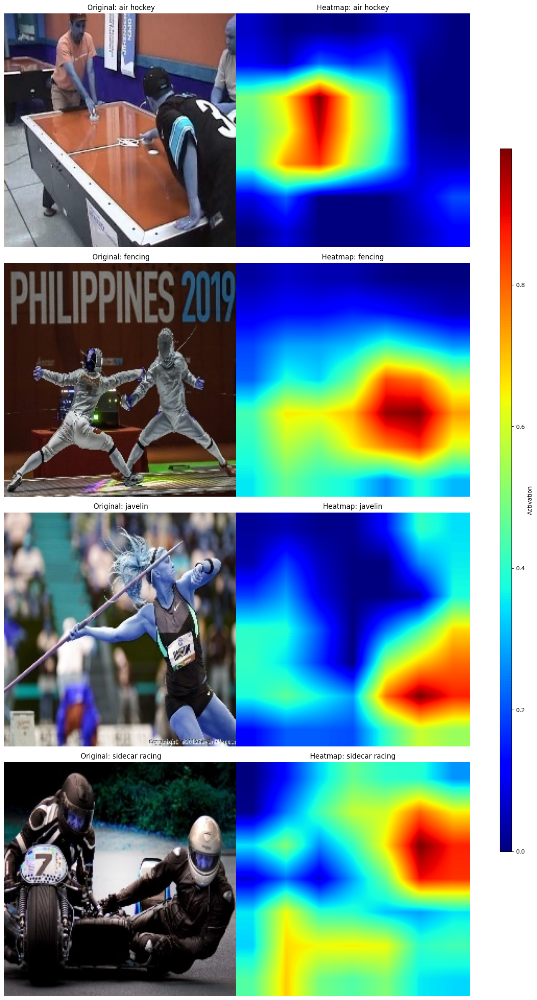

({0: {'sample': <tf.Tensor: shape=(1, 224, 224, 3), dtype=float32, numpy=
   array([[[[ 63.,  81., 110.],
            [ 53.,  72., 105.],
            [ 47.,  69., 111.],
            ...,
            [108.,  82.,  98.],
            [117.,  98., 115.],
            [112.,  94., 111.]],
   
           [[ 65.,  83., 114.],
            [ 54.,  73., 108.],
            [ 47.,  69., 111.],
            ...,
            [130., 108., 127.],
            [150., 131., 150.],
            [153., 137., 155.]],
   
           [[ 65.,  82., 115.],
            [ 55.,  73., 110.],
            [ 48.,  69., 114.],
            ...,
            [152., 133., 158.],
            [163., 147., 170.],
            [168., 152., 175.]],
   
           ...,
   
           [[191., 187., 182.],
            [185., 183., 182.],
            [181., 187., 192.],
            ...,
            [ 28.,  26.,  26.],
            [ 30.,  25.,  26.],
            [ 31.,  25.,  26.]],
   
           [[196., 193., 189.],
            [185.,

In [ ]:
analyze_feature_importance(model, test_dataset)

The illustration depicts activation heat maps for four different sports (air hockey, fencing, javelin, and sidecar racing) illustrating how the model highlights interesting details of every sport. The red parts in the heat maps are the regions of greatest attention, surrounding the center of the playing surface in air hockey, the dueling stance in fencing, the throwing engage position in javelin, and the motorcycle with sidecar attachment in racing. It indicates the model in essence learns to associate certain features and equipment with some sports to assist in classification.

